In [1]:
#https://towardsdatascience.com/understanding-encoder-decoder-sequence-to-sequence-model-679e04af4346

In [2]:
#https://d2l.ai/chapter_recurrent-modern/encoder-decoder.html

In [3]:
#https://blog.keras.io/a-ten-minute-introduction-to-sequence-to-sequence-learning-in-keras.html

In [4]:
#https://www.kaggle.com/code/rahulrky/encoder-decoder

In [1]:
import os
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split as tts
from sklearn.linear_model import LogisticRegression as logit
from sklearn.ensemble import RandomForestClassifier as RF
from sklearn.metrics import roc_auc_score
import keras as ks
import tensorflow as tf
from scipy.special import erfinv
import plotly.express as px
import seaborn as sns
import plotly.figure_factory as ff
from plotly.offline import iplot
import math

import warnings
warnings.filterwarnings("ignore")

In [2]:
compresion = 3
eps = 100
bs = 2048
leRa = 0.02
dec = 0.0001

randRatioViz = 0.1

"Learning rate and decay ok?: " + str(leRa - dec * eps > 0)

'Learning rate and decay ok?: True'

In [3]:
train = pd.read_csv("C:/BITsPilaniMTECH2123/Sem3/NLP/NLP_All_Practice/Word2vec_Doc2vec/train.csv")
train_id = train.id
test = pd.read_csv("C:/BITsPilaniMTECH2123/Sem3/NLP/NLP_All_Practice/Word2vec_Doc2vec/test.csv")
test_id = test.id

In [5]:
Xx = pd.concat([train.drop("target", axis = 1), test])
Xx = Xx.set_index("id")
Xx.head(3)

,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10
id,,,,,,,,,,,,,,,,,,,,,
0,A,I,A,B,B,BI,A,S,Q,A,...,0.855349,0.759439,0.795549,0.681917,0.621672,0.592184,0.791921,0.815254,0.965006,0.665915
1,A,I,A,A,E,BI,K,W,AD,F,...,0.328929,0.386385,0.541366,0.388982,0.357778,0.600044,0.408701,0.399353,0.927406,0.493729
2,A,K,A,A,E,BI,A,E,BM,L,...,0.322749,0.343255,0.616352,0.793687,0.552877,0.352113,0.388835,0.412303,0.292696,0.549452


In [6]:
#Creating list of for categorical and continuous 
catVars = [c for c in Xx.columns if "cat" in c]
contVars = [c for c in Xx.columns if "cont" in c]

In [7]:
#Categorical
le = preprocessing.LabelEncoder()
for c in catVars:
    Xx[f"{c}"] = le.fit_transform(Xx[f"{c}"])

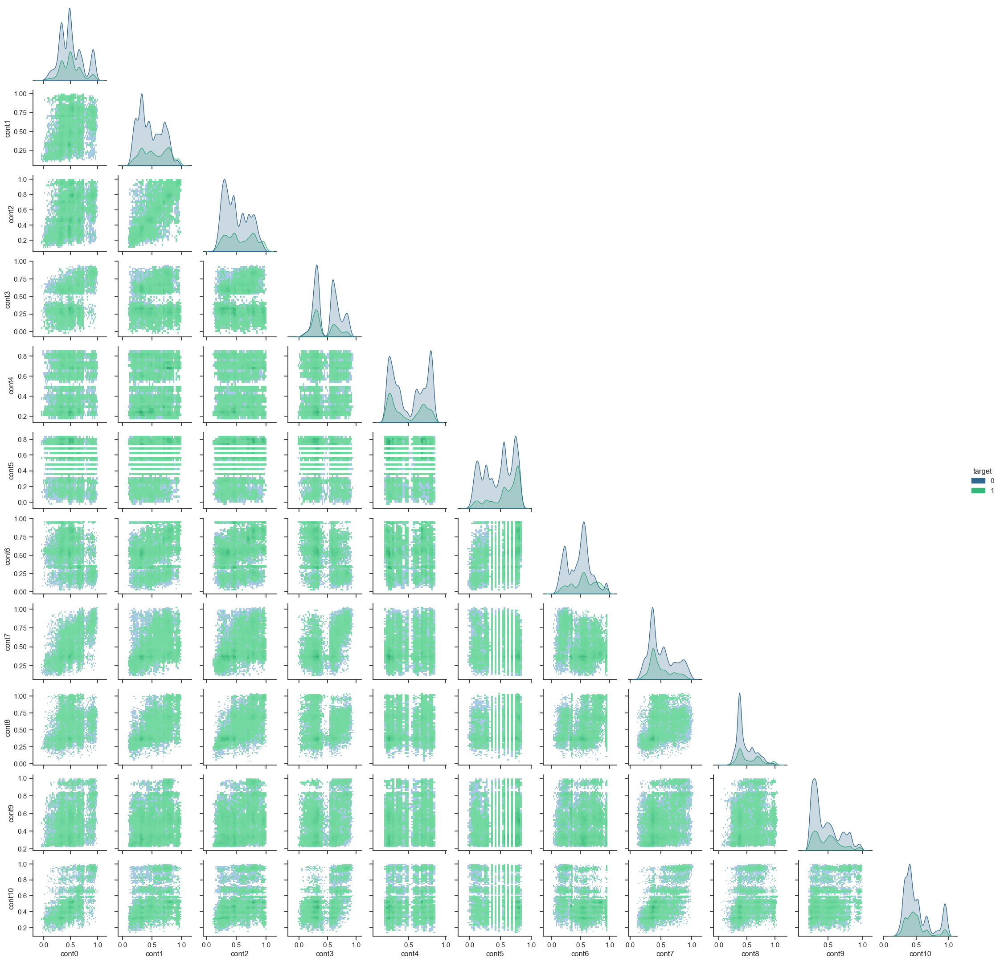

In [8]:
#Checking Corelation
r = list(np.random.random_sample(train.shape[0]) <= randRatioViz)

df = train.loc[r,contVars]
df["target"] = train.loc[r,["target"]]

sns.set_theme(style="ticks")

sns.pairplot(df, 
             hue="target",
             palette ="viridis",
             kind="hist",
             height=2,
             diag_kind="kde",
             corner=True
             )

In [9]:
#Rank Gauss
def rg(df, e, Vars):
    for i in df.loc[:,Vars]:
        r = df[i].rank()
        Range = (r/r.max()-0.5)*2
        Range = np.clip(Range, a_max = 1-e, a_min = -1+e)
        rg = erfinv(Range)
        df[i] = rg * 2**0.5
    return df

In [10]:
Xx_train = rg(Xx, 0.000001, contVars)

In [11]:
#Define the encoder and the decoder
def autoencoder(DataSet, comp):
    
    """This function returns the encoder, the autoencoder, and the names of the embeddings 
    the output-layer as input for the decoder, the inputs, the outputs and the names ot all inputs"""
    
    inputs = []
    outputs = []
    names = []

    for c in catVars:

        inputDims = len(DataSet[f"{c}"].unique())
        embedDim = min([math.ceil(inputDims / 10), 10])

        INPUT = ks.layers.Input(shape=(1), name=c + "_emb")
        OUTPUT = ks.layers.Embedding(inputDims + 1, embedDim)(INPUT)
        OUTPUT = ks.layers.Reshape(target_shape=(embedDim, ))(OUTPUT)

        inputs.append(INPUT)
        outputs.append(OUTPUT)
        names.append(c + "_emb")

    contNum = len(DataSet.columns) - len(catVars) 

    INPUT = ks.layers.Input(shape=(contNum,), name="Vars")

    outputs.append(INPUT)
    inputs.append(INPUT)

    CONCAT = ks.layers.Concatenate()(outputs)

    OUT = ks.layers.Dropout(0.1)(CONCAT)
    OUT = ks.layers.BatchNormalization()(OUT)
    OUT = ks.layers.Dense(150, activation='relu')(OUT)

    OUT = ks.layers.Dropout(0.1)(OUT)
    OUT = ks.layers.BatchNormalization()(OUT)
    OUT = ks.layers.Dense(15, activation='relu')(OUT)

    OUT = ks.layers.Dropout(0.1)(OUT)
    OUT = ks.layers.BatchNormalization()(OUT)
    OUT = ks.layers.Dense(comp, activation='linear')(OUT)

    encoder = ks.Model(inputs=inputs, outputs=OUT)

    OUT = ks.layers.Dropout(0.1)(OUT)
    OUT = ks.layers.BatchNormalization()(OUT)
    OUT = ks.layers.Dense(15, activation='relu')(OUT)

    OUT = ks.layers.Dropout(0.1)(OUT)
    OUT = ks.layers.BatchNormalization()(OUT)
    OUT = ks.layers.Dense(150, activation='relu')(OUT)

    OUT = ks.layers.Dropout(0.1)(OUT)
    OUT = ks.layers.BatchNormalization()(OUT)
    OUT = ks.layers.Dense(30-len(catVars), activation='linear')(OUT)

    AE = ks.Model(inputs=inputs, outputs=OUT)
    
    return encoder, AE, names

In [12]:
help(autoencoder)

Help on function autoencoder in module __main__:

autoencoder(DataSet, comp)
    This function returns the encoder, the autoencoder, and the names of the embeddings 
    the output-layer as input for the decoder, the inputs, the outputs and the names ot all inputs



In [13]:
#Combining
ENCODER, AUTOENCODER, names = autoencoder(Xx,compresion)

#Converts a Keras model to dot format and save to a file.
ks.utils.plot_model(AUTOENCODER,
                    to_file="model.png",
                    show_shapes=True, 
                    show_layer_names=True,
                    dpi = 1080
                    )

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [14]:
def rmse(y_pred, y_true):
    y_pred = tf.cast(y_pred, dtype="float32")
    y_true = tf.cast(y_true, dtype="float32")
    r = tf.sqrt(tf.keras.backend.mean(tf.square(y_pred - y_true)))
    return r

In [15]:
stop = ks.callbacks.EarlyStopping(monitor='AUC', min_delta=0.000001, patience=10, mode='max')

In [16]:
optimizer = ks.optimizers.Adam(lr=leRa, decay=dec)
AUTOENCODER.compile(optimizer = optimizer, loss = rmse)

In [17]:
X_Train = {names[c]: Xx_train.iloc[:,c] for c in range(len(catVars))}
X_Train.update({"Vars": Xx_train.drop(catVars, axis=1)})

In [18]:
history = ks.callbacks.History()

AUTOENCODER.fit(X_Train, 
                Xx.drop(catVars, axis=1), 
                epochs = eps, 
                batch_size = bs, 
                shuffle = False,
                callbacks=[history]
               )

Epoch 1/100
245/245 [==============================] - 22s 60ms/step - loss: 0.6762
Epoch 2/100
245/245 [==============================] - 14s 58ms/step - loss: 0.6221
Epoch 3/100
245/245 [==============================] - 14s 57ms/step - loss: 0.6160
Epoch 4/100
245/245 [==============================] - 14s 57ms/step - loss: 0.6131
Epoch 5/100
245/245 [==============================] - 14s 58ms/step - loss: 0.6111
Epoch 6/100
245/245 [==============================] - 14s 58ms/step - loss: 0.6100
Epoch 7/100
245/245 [==============================] - 13s 53ms/step - loss: 0.6093
Epoch 8/100
245/245 [==============================] - 12s 48ms/step - loss: 0.6080
Epoch 9/100
245/245 [==============================] - 10s 39ms/step - loss: 0.6077
Epoch 10/100
245/245 [==============================] - 9s 38ms/step - loss: 0.6067
Epoch 11/100
245/245 [==============================] - 10s 40ms/step - loss: 0.6062
Epoch 12/100
245/245 [==============================] - 11s 44ms/step - los

245/245 [==============================] - 7s 28ms/step - loss: 0.5964
Epoch 98/100
245/245 [==============================] - 7s 28ms/step - loss: 0.5960
Epoch 99/100
245/245 [==============================] - 7s 28ms/step - loss: 0.5960
Epoch 100/100
245/245 [==============================] - 7s 28ms/step - loss: 0.5964


In [19]:
Denoised = AUTOENCODER.predict(
   x=X_Train, 
   workers = 1, 
   use_multiprocessing = True
)

Denoised = pd.DataFrame(Denoised, columns=contVars)

Denoised = pd.concat([Xx.loc[:,catVars], Denoised], axis=1)
    
Denoised.head()

15625/15625 [==============================] - 27s 2ms/step


,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10
0,0,8,0,1,1,33,0,44,54,0,...,1.224162,1.081935,1.096930,0.425778,0.647020,0.245700,1.064320,0.977199,1.641755,1.066841
1,0,8,0,0,4,33,8,48,3,5,...,-0.528425,-0.615043,-0.010984,-0.684306,0.054651,-0.275871,-0.259935,-0.363170,0.053119,-0.207796
2,0,10,0,0,4,33,0,30,38,9,...,-0.453720,-0.462889,0.179747,0.661452,-0.337523,-0.540468,0.248768,-0.336459,-0.342409,0.387514
3,0,10,0,2,4,33,0,50,3,5,...,0.994560,1.088737,1.340193,0.875343,-0.031613,-0.713444,1.394146,0.729192,1.063097,1.349032
4,0,8,6,1,4,33,2,32,54,0,...,-1.219457,-1.038880,-0.681363,-0.691961,-0.810336,-0.168708,-1.225521,-0.924463,-0.386339,-1.007638


In [20]:
X_Compress = {names[c]: Xx_train.iloc[train_id,c] for c in range(len(catVars))}
X_Compress.update({"Vars": Xx_train.iloc[train_id,:].drop(catVars, axis=1)})

In [21]:
Compressed = ENCODER.predict(
   x=X_Compress, 
   workers = 1, 
   use_multiprocessing = True
)

Compressed = pd.DataFrame(Compressed, columns=["dim_{0}".format(i) for i in range(Compressed.shape[1])])
Compressed["target"] = train.target.astype("category")
Compressed.head()

9375/9375 [==============================] - 15s 2ms/step


,dim_0,dim_1,dim_2,target
0,24.487782,27.463316,-29.866987,0
1,-0.182097,-1.516838,2.397390,0
2,0.896758,9.393726,2.598973,0
3,58.784836,50.635830,-8.464971,0
4,0.873893,-4.761734,21.409561,1


In [22]:
#Compressed Representation
r = list(np.random.random_sample(Compressed.shape[0]) <= randRatioViz)

Compressed = Compressed.loc[r,:]

fig = px.scatter_3d(
     Compressed, 
     x='dim_0', 
     y='dim_1', 
     z='dim_2',
     color='target',
     hover_data={'dim_0': False, 
                 'dim_1': False,
                 'dim_2': False,
                 'target': True
             },
     opacity=1,
     color_discrete_sequence=px.colors.qualitative.Antique,
     title="Compressed Representation",
     template="simple_white"
     )

fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='grey')),
                  selector=dict(mode='markers'))

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0),
                 scene=dict(bgcolor='white'))

fig.show()

In [23]:
#Using the denoised data:
for c in catVars:
    Denoised[f"{c}"] = Denoised[f"{c}"].astype("category")

tr = Denoised.loc[train_id,:]
print(tr.shape)
te = Denoised.loc[test_id,:]
te.shape

(300000, 30)


(200000, 30)

In [24]:
cv_size = 0.2
X_train, X_test, y_train, y_test = tts(tr, train.target, test_size=cv_size, random_state=42)

y_train.describe()

count    240000.000000
mean          0.265629
std           0.441669
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: target, dtype: float64

In [25]:
clf = RF(n_estimators=80, 
         min_samples_leaf=5,
         max_depth=20, 
         min_samples_split=5, 
         random_state=0,
         n_jobs=-1
         )

clf.fit(X_train, y_train)

print("AUC is: " + str(roc_auc_score(y_test, clf.predict_proba(X_test)[:,1])))
print("Accuracy is: " + str(clf.score(X_test, y_test)))

AUC is: 0.8740471092169414
Accuracy is: 0.8403
